In [1]:
from sklearnex import patch_sklearn
patch_sklearn()


Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)


In [2]:
# import libraries
import tensorflow as tf

2023-04-08 08:14:59.417440: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [3]:

from tensorflow.keras import models, layers
import matplotlib.pyplot as plt
import numpy as np
import pathlib
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2' # to disable all debugging logs

In [4]:
# importing dataset
dir = os.listdir()
for filenames in dir:
    print(filenames)

Untitled1.ipynb
Tomato_Leaf_Mold
mandelbrot
.bash_profile.bak2
tp
MPI_with_OpenMP_or_DPCPP
.ssh
tmp
OpenMP_Offload
.bash_profile.bak
xpublog
.jupyter
Tomato_Late_blight
Marketvis.ipynb
.keras
Tomato_Early_blight
Untitled4.ipynb
Untitled5.ipynb
.bashrc
.ipython
RenderKit_Learning_Path
Tomato__Tomato_mosaic_virus
Untitled6.ipynb
Untitled2.ipynb
.bash_history
logs.log
Untitled.ipynb
tomato.h5
datasets
.ipynb_checkpoints
.bash_profile
LossVal_loss.png
.bash_logout
Hough_Transform_on_FPGAs_Using_oneAPI
.cache
Intel_oneAPI_MKL_Training
Untitled3.ipynb
.config
SYCL_Performance_Portability
Tomato_Bacterial_spot
Tomato_healthy
.local
MLoneAPI
AI_Kit_XGBoost_Predictive_Modeling
oneAPI_Essentials
Tomato_leaf_disease_detection.ipynb
AccVal_acc.png
Price of Tomato Karnataka(2016-2018).csv


In [5]:
#!cp -rf Tomato__Tomato_mosaic_virus ./tp 

In [6]:
#!cp -rf Tomato_Bacterial_spot ./tp

In [7]:
#!cp -rf Tomato_Early_blight ./tp

In [8]:
#!cp -rf Tomato_Leaf_Mold ./tp

In [9]:
#!cp -rf Tomato_Late_blight ./tp

In [10]:
#!cp -rf Tomato_healthy ./tp

In [11]:
#Global initialization of some imp variables
Image_Size = 256
Batch_Size = 32
Channels = 3
Epochs = 40


In [12]:
#yields batches of images from the subdirectories class_a , class_b and class_c 
#together with labels 0 , 1 and 2 (0, 1, 2 corresponding to classes class_a , class_b and class_c respectively )
dataset = tf.keras.preprocessing.image_dataset_from_directory(
    'tp', batch_size = Batch_Size, image_size = (Image_Size, Image_Size), shuffle = True) 

Found 4814 files belonging to 6 classes.


2023-04-08 08:15:24.701748: I tensorflow/core/common_runtime/process_util.cc:146] Creating new thread pool with default inter op setting: 


In [13]:
#Folders(classes) in 'Dataset' directory
class_name = dataset.class_names
class_name

['.ipynb_checkpoints',
 'Tomato_Bacterial_spot',
 'Tomato_Early_blight',
 'Tomato_Late_blight',
 'Tomato_Leaf_Mold',
 'Tomato_healthy']

In [14]:
len(dataset) # Number of Batches = (total number of files belonging to all classes / Batch_Size)

151

In [15]:
print(dataset) #prints Elements in dataset: here 1st element is image and 2nd index of that image.

<_BatchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>


2023-04-08 08:15:24.864833: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [4814]
	 [[{{node Placeholder/_4}}]]
2023-04-08 08:15:24.865340: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [4814]
	 [[{{node Placeholder/_0}}]]


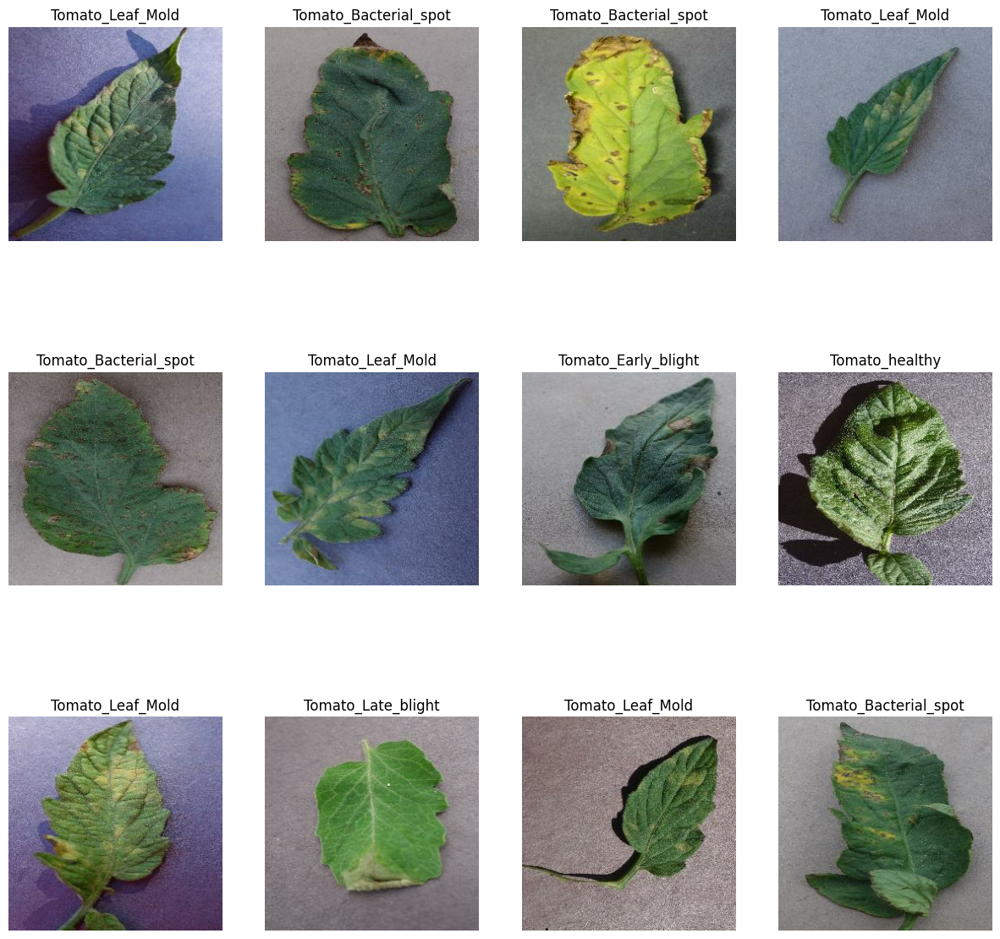

In [16]:
# Plotting the image
plt.figure(figsize = (15,15))
# dataset.take(count) : Creates a Dataset with at most 'count' elements(batch) from the dataset
for image, label in dataset.take(1): 
    for i in range(12):
        plt.subplot(3, 4, i+1) # many plots at a time =>subpots
        plt.imshow(image[i].numpy().astype('uint8')) #converting all data of image into numpy and than to intiger type as they were in float.
        plt.title(class_name[label[i]])  # title of the class_name of image
        plt.axis("off") # Hide the values of graph
        

In [17]:
# Function for Splitting the data
def split_dataset(ds, train_split=0.8, val_split=0.1, test_split=0.1, shuffle=True, shuffle_size=10000):
    
    if shuffle:
        ds = ds.shuffle(shuffle_size, seed = 10)
        
    ds_size = len(ds)
    train_size = int(train_split * ds_size)
    val_size = int(val_split * ds_size)
    
    train_ds = ds.take(train_size)
    val_ds = ds.skip(train_size).take(val_size)
    test_ds = ds.skip(train_size).skip(val_size)
    
    return train_ds, val_ds, test_ds

In [18]:
train_data, val_data, test_data = split_dataset(dataset)

In [19]:
print("Size of Data is :{0} \nBatch size of Training Data is :{1}\nBatch size of Validation Data is :{2} \nBatch size of Testing Data is :{3} " .format(len(dataset), len(train_data), len(val_data), len(test_data)))

Size of Data is :151 
Batch size of Training Data is :120
Batch size of Validation Data is :15 
Batch size of Testing Data is :16 


In [20]:
# caching,shuffle and prefetching the data
train_ds = train_data.cache().shuffle(100).prefetch(buffer_size = tf.data.AUTOTUNE)
val_ds = val_data.cache().shuffle(100).prefetch(buffer_size = tf.data.AUTOTUNE)
test_ds = test_data.cache().shuffle(100).prefetch(buffer_size = tf.data.AUTOTUNE)

# Data Pre-processing 

In [21]:
# Image Preprocessing : Rescaling and Resizing
resize_and_rescale = tf.keras.Sequential([
    layers.experimental.preprocessing.Resizing(Image_Size, Image_Size),
    layers.experimental.preprocessing.Rescaling(1.0/255)
])

In [22]:
# Data augmentation by flipping and rotating existing images
data_augmentation = tf.keras.Sequential([
    layers.experimental.preprocessing.RandomFlip(mode="horizontal_and_vertical"),
    layers.experimental.preprocessing.RandomRotation(factor = 0.5)
])

# Model Building

In [23]:
# Creating Convolution layer 
input_shape = (Batch_Size, Image_Size, Image_Size, Channels)
model = models.Sequential([
    resize_and_rescale,
    data_augmentation,
    layers.Conv2D(filters = 16, kernel_size = (3,3), activation = 'relu', input_shape = input_shape),
    layers.MaxPool2D((2,2)),
    layers.Conv2D(64, (3,3), activation = 'relu'),
    layers.MaxPool2D((2,2)),
    layers.Conv2D(128, (3,3), activation = 'relu'),
    layers.MaxPool2D((2,2)),
    layers.Conv2D(64, (3,3), activation = 'relu'),
    layers.MaxPool2D((2,2)),
    layers.Conv2D(128, (3,3), activation = 'relu'),
    layers.MaxPool2D((2,2)),
    layers.Conv2D(64, (3,3), activation = 'relu'),
    layers.MaxPool2D((2,2)),
    layers.Flatten(),
    layers.Dense(128, activation = 'relu'),
    layers.Dense(64, activation = 'softmax'),

])


model.build(input_shape = input_shape)

In [24]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (32, 256, 256, 3)         0         
                                                                 
 sequential_1 (Sequential)   (32, 256, 256, 3)         0         
                                                                 
 conv2d (Conv2D)             (32, 254, 254, 16)        448       
                                                                 
 max_pooling2d (MaxPooling2D  (32, 127, 127, 16)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (32, 125, 125, 64)        9280      
                                                                 
 max_pooling2d_1 (MaxPooling  (32, 62, 62, 64)         0         
 2D)                                                  

In [25]:
# Optimizing the model 'SparseCategoricalCrossentropy'=>as there are many categorical classes of data
model.compile(
    optimizer = 'adam', 
    loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits = False), 
    metrics = ['accuracy'])

In [26]:
#Fit the model with training data and also pass validation data
history = model.fit(train_data, epochs = 10, batch_size = Batch_Size , verbose = 1, validation_data = val_data)

Epoch 1/10


2023-04-08 08:15:26.973305: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [4814]
	 [[{{node Placeholder/_4}}]]
2023-04-08 08:15:26.973688: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [4814]
	 [[{{node Placeholder/_4}}]]


120/120 [==============================] - ETA: 0s - loss: 1.6990 - accuracy: 0.2993

2023-04-08 08:16:33.275556: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [4814]
	 [[{{node Placeholder/_4}}]]
2023-04-08 08:16:33.276617: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [4814]
	 [[{{node Placeholder/_4}}]]


120/120 [==============================] - 69s 542ms/step - loss: 1.6990 - accuracy: 0.2993 - val_loss: 1.5301 - val_accuracy: 0.3375
Epoch 2/10
120/120 [==============================] - 65s 541ms/step - loss: 1.2096 - accuracy: 0.4830 - val_loss: 1.1134 - val_accuracy: 0.5758
Epoch 3/10
120/120 [==============================] - 65s 539ms/step - loss: 0.8638 - accuracy: 0.6567 - val_loss: 0.8478 - val_accuracy: 0.6708
Epoch 4/10
120/120 [==============================] - 65s 534ms/step - loss: 0.6879 - accuracy: 0.7284 - val_loss: 0.7715 - val_accuracy: 0.6979
Epoch 5/10
120/120 [==============================] - 65s 540ms/step - loss: 0.5504 - accuracy: 0.7875 - val_loss: 0.4996 - val_accuracy: 0.8125
Epoch 6/10
120/120 [==============================] - 65s 539ms/step - loss: 0.4806 - accuracy: 0.8163 - val_loss: 0.8698 - val_accuracy: 0.6875
Epoch 7/10
120/120 [==============================] - 64s 532ms/step - loss: 0.4812 - accuracy: 0.8176 - val_loss: 0.9392 - val_accuracy: 0.6

In [27]:
scores = model.evaluate(train_data)

120/120 [==============================] - 15s 115ms/step - loss: 0.4190 - accuracy: 0.8386


In [28]:
scores = model.evaluate(test_data)

2023-04-08 08:28:02.174209: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [4814]
	 [[{{node Placeholder/_0}}]]
2023-04-08 08:28:02.175233: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [4814]
	 [[{{node Placeholder/_4}}]]


16/16 [==============================] - 3s 128ms/step - loss: 0.4043 - accuracy: 0.8281


In [29]:
history

In [30]:
history.params

{'verbose': 1, 'epochs': 10, 'steps': 120}

In [31]:
history.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

# Analyzing the Output

In [32]:
# Getting the model history to analyse
train_loss = history.history['loss']
train_acc = history.history['accuracy']

val_loss = history.history['val_loss']
val_acc = history.history['val_accuracy']


Text(0.5, 1.0, 'Training and Validation Loss')

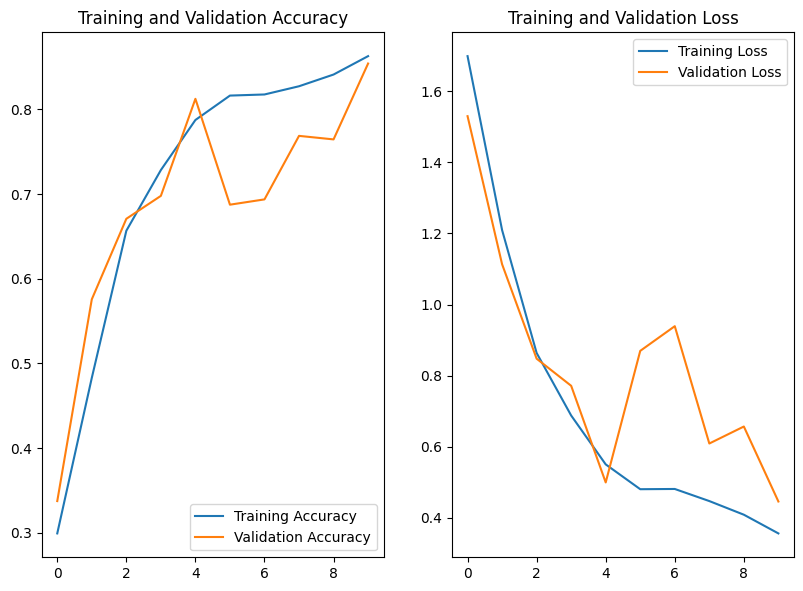

In [33]:
#graphs for accuracy and loss of training and validation data
plt.figure(figsize = (15,15))
plt.subplot(2,3,1)
plt.plot(range(10), train_acc, label = 'Training Accuracy')
plt.plot(range(10), val_acc, label = 'Validation Accuracy')
plt.legend(loc = 'lower right')
plt.title('Training and Validation Accuracy') 

plt.subplot(2,3,2)
plt.plot(range(10), train_loss, label = 'Training Loss')
plt.plot(range(10), val_loss, label = 'Validation Loss')
plt.legend(loc = 'upper right')
plt.title('Training and Validation Loss')

2023-04-08 08:28:05.300295: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [4814]
	 [[{{node Placeholder/_0}}]]
2023-04-08 08:28:05.300744: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [4814]
	 [[{{node Placeholder/_4}}]]


First Image of batch to predict :
Actual label :  Tomato_Early_blight
1/1 [==============================] - 1s 776ms/step
Predicted label :  Tomato_Early_blight


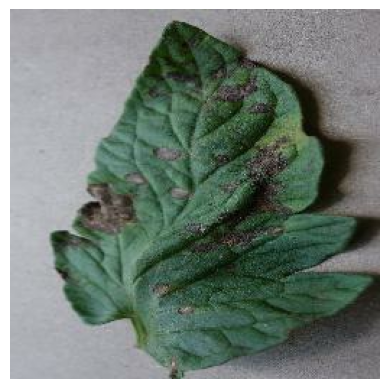

In [34]:
#plotting image
for batch_image, batch_label in train_data.take(1):
    first_image = batch_image[0].numpy().astype('uint8')
    first_label = class_name[batch_label[0]]
    
    print('First Image of batch to predict :')
    plt.imshow(first_image)
    print('Actual label : ', first_label)
    
    batch_prediction = model.predict(batch_image)
    print('Predicted label : ', class_name[np.argmax(batch_prediction[0])])
    plt.axis('off')

2023-04-08 08:28:07.121866: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [4814]
	 [[{{node Placeholder/_4}}]]
2023-04-08 08:28:07.122227: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [4814]
	 [[{{node Placeholder/_0}}]]


1/1 [==============================] - 0s 136ms/step


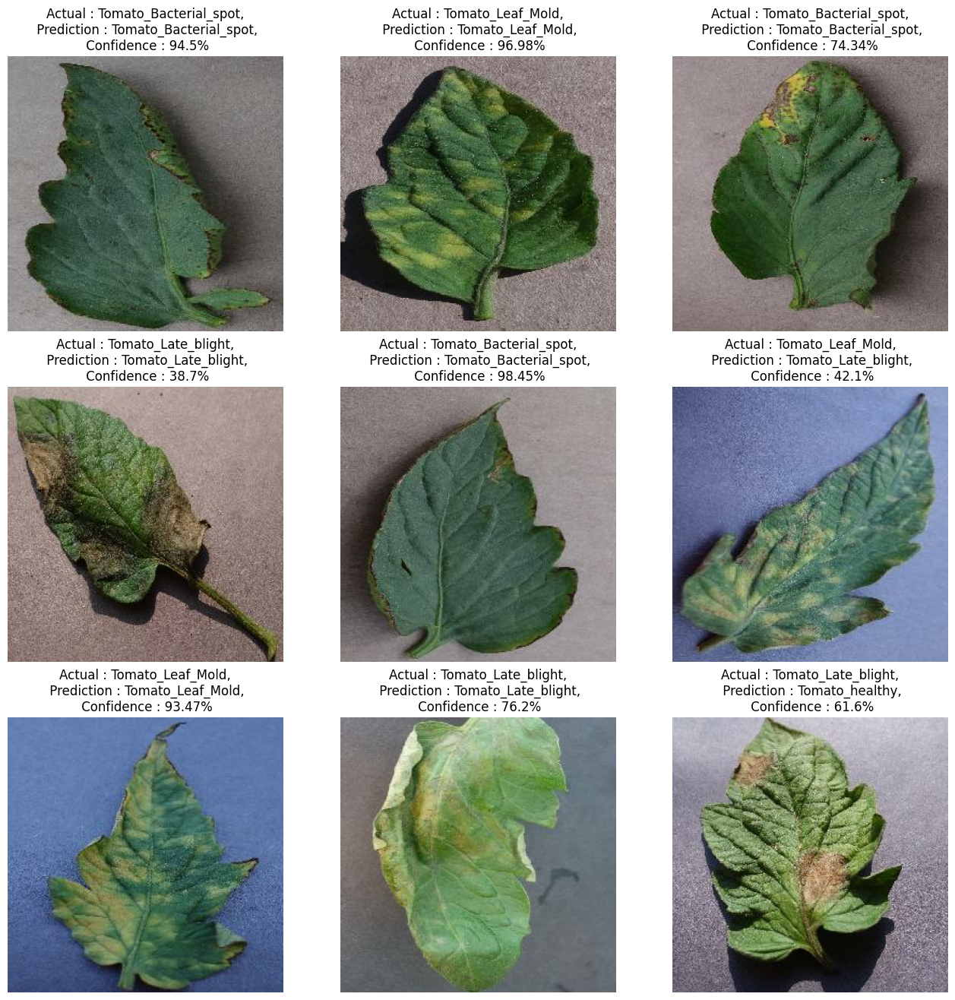

In [35]:
# plotting batch of images with its actual label, predicted label and confidence
plt.figure(figsize = (16,16))
for batch_image, batch_label in train_data.take(1):
    for i in range(9):
        ax = plt.subplot(3,3,i+1)
        image = batch_image[i].numpy().astype('uint8')
        label = class_name[batch_label[i]]
    
        plt.imshow(image)
    
        batch_prediction = model.predict(batch_image)
        predicted_class = class_name[np.argmax(batch_prediction[i])]
        confidence = round(np.max(batch_prediction[i]) * 100, 2)
        
        plt.title(f'Actual : {label},\n Prediction : {predicted_class},\n Confidence : {confidence}%')
    
        plt.axis('off')

2023-04-08 08:28:10.615466: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [4814]
	 [[{{node Placeholder/_4}}]]
2023-04-08 08:28:10.615916: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [4814]
	 [[{{node Placeholder/_4}}]]


1/1 [==============================] - 0s 155ms/step


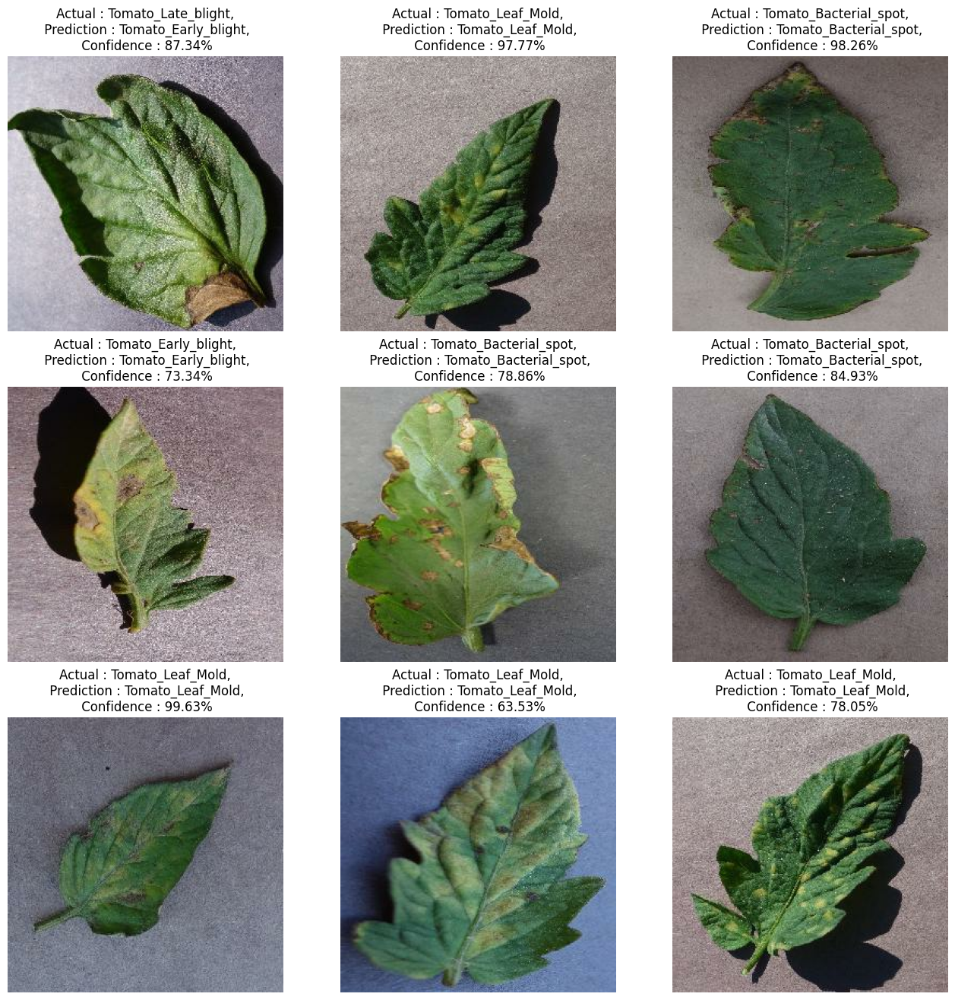

In [36]:
# plotting batch of images with its actual label, predicted label and confidence
plt.figure(figsize = (16,16))
for batch_image, batch_label in test_data.take(1):
    for i in range(9):
        ax = plt.subplot(3,3,i+1)
        image = batch_image[i].numpy().astype('uint8')
        label = class_name[batch_label[i]]
    
        plt.imshow(image)
    
        batch_prediction = model.predict(batch_image)
        predicted_class = class_name[np.argmax(batch_prediction[i])]
        confidence = round(np.max(batch_prediction[i]) * 100, 2)
        
        plt.title(f'Actual : {label},\n Prediction : {predicted_class},\n Confidence : {confidence}%')
    
        plt.axis('off')

2023-04-08 08:28:14.065448: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [4814]
	 [[{{node Placeholder/_4}}]]
2023-04-08 08:28:14.066065: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [4814]
	 [[{{node Placeholder/_0}}]]


1/1 [==============================] - 0s 89ms/step


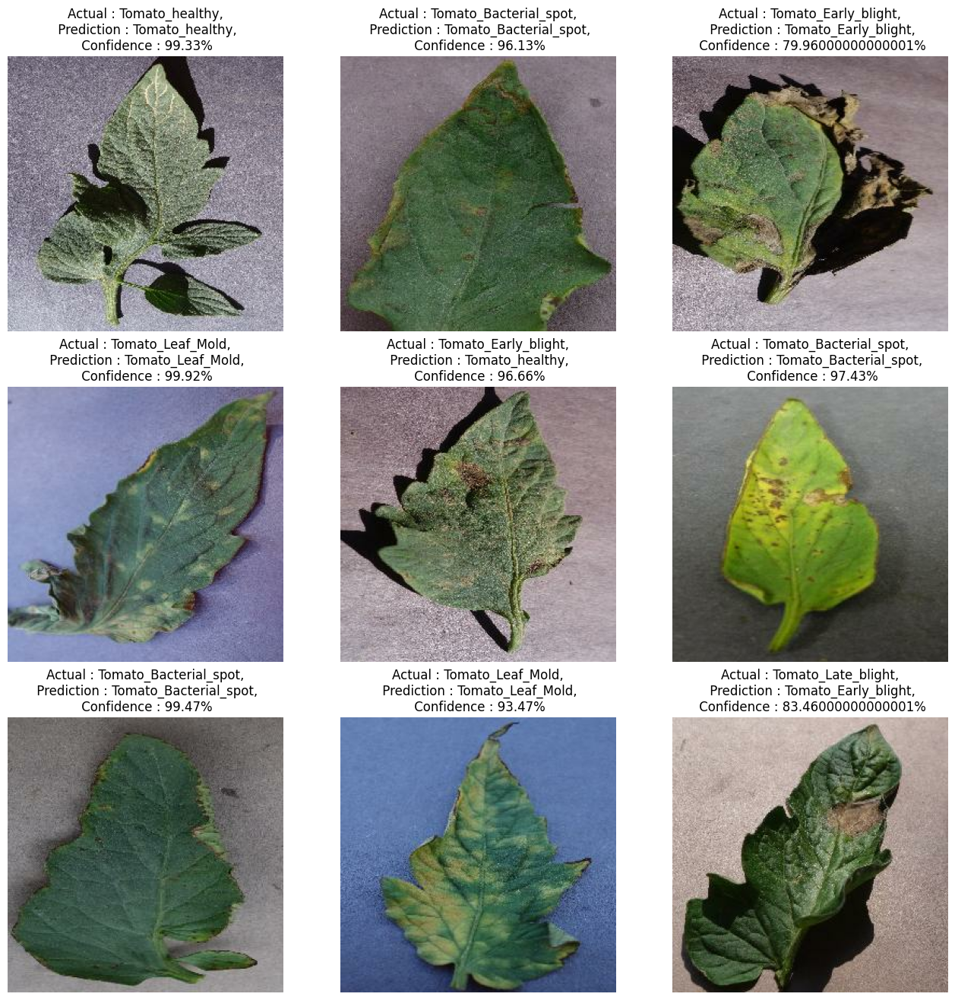

In [37]:
# plotting batch of images with its actual label, predicted label and confidence
plt.figure(figsize = (16,16))
for batch_image, batch_label in test_data.take(1):
    for i in range(9):
        ax = plt.subplot(3,3,i+1)
        image = batch_image[i].numpy().astype('uint8')
        label = class_name[batch_label[i]]
    
        plt.imshow(image)
    
        batch_prediction = model.predict(batch_image)
        predicted_class = class_name[np.argmax(batch_prediction[i])]
        confidence = round(np.max(batch_prediction[i]) * 100, 2)
        
        plt.title(f'Actual : {label},\n Prediction : {predicted_class},\n Confidence : {confidence}%')
    
        plt.axis('off')

In [38]:
# Save the model using TensorFlow SavedModel format
model.save('tomato.h5')